# Reference genome testing - Merging

<div class="alert alert-warning">

**What the fourth section (Merging and Clustering) does**
    
This section merges the different datasets and visualizes the merged data. The section contains the following important subsections:

* Merging <br>
* Alignment parameter visualization <br>
</div>

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#Hey
hey_93_reg_processed='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_reference_genome_testing/data/hey_93_f1_reg_processed_1.h5ad'
hey_98_reg_processed='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables//0_testing/0_reference_genome_testing/data/hey_98_f1_reg_processed_1.h5ad'

#Zhong
zhong_93_reg_processed='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_reference_genome_testing/data/zhong_93_f1_reg_processed_1.h5ad'
zhong_98_reg_processed='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_reference_genome_testing/data/zhong_98_f1_reg_processed_1.h5ad'


In [3]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_reference_genome_testing/')

In [4]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_reference_genome_testing'

In [5]:
!ls data/

hey_93_f1_processed_1.h5ad	zhong_93_f1_processed_1.h5ad
hey_93_f1_reg_processed_1.h5ad	zhong_93_f1_reg_processed_1.h5ad
hey_93_filtered_1.h5ad		zhong_93_filtered_1.h5ad
hey_93_preprocessed.h5ad	zhong_93_preprocessed.h5ad
hey_98_f1_processed_1.h5ad	zhong_98_f1_processed_1.h5ad
hey_98_f1_reg_processed_1.h5ad	zhong_98_f1_reg_processed_1.h5ad
hey_98_filtered_1.h5ad		zhong_98_filtered_1.h5ad
hey_98_preprocessed.h5ad	zhong_98_preprocessed.h5ad


In [7]:
files = [hey_93_reg_processed,hey_98_reg_processed, zhong_93_reg_processed, zhong_98_reg_processed]

In [8]:
names = [name.split('_reg_processed')[0].split('/data/')[1] for name in files ]
print(names)

['hey_93_f1', 'hey_98_f1', 'zhong_93_f1', 'zhong_98_f1']


In [9]:
object_names_processed=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_processed.append("adata"+"_"+names[i]+"_reg_"+"processed")
    locals()[object_names_processed[i]] = sc.read(files[i]) 
    print(object_names_processed[i],' is loaded')

adata_hey_93_f1_reg_processed  is loaded
adata_hey_98_f1_reg_processed  is loaded
adata_zhong_93_f1_reg_processed  is loaded
adata_zhong_98_f1_reg_processed  is loaded


In [6]:
#Hey
hey_93_processed='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_reference_genome_testing/data/hey_93_f1_processed_1.h5ad'
hey_98_processed='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_reference_genome_testing/data/hey_98_f1_processed_1.h5ad'

#Zhong
zhong_93_processed='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_reference_genome_testing/data/zhong_93_f1_processed_1.h5ad'
zhong_98_processed='/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_testing/0_reference_genome_testing/data/zhong_98_f1_processed_1.h5ad'


In [7]:
files = [hey_93_processed,hey_98_processed, zhong_93_processed, zhong_98_processed]

In [8]:
names = [name.split('_processed')[0].split('/data/')[1] for name in files ]
print(names)

['hey_93_f1', 'hey_98_f1', 'zhong_93_f1', 'zhong_98_f1']


In [9]:
object_names_processed=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_processed.append("adata"+"_"+names[i]+"_processed")
    locals()[object_names_processed[i]] = sc.read(files[i]) 
    print(object_names_processed[i],' is loaded')

adata_hey_93_f1_processed  is loaded
adata_hey_98_f1_processed  is loaded
adata_zhong_93_f1_processed  is loaded
adata_zhong_98_f1_processed  is loaded


In [10]:
locals()[object_names_processed[0]]

AnnData object with n_obs × n_vars = 4080 × 17771
    obs: 'species', 'cngb_sample_id', 'sample_group', 'atlas', 'reference', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'log1p', 'neighbors', 'pca', 'scrublet', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [11]:
np.random.seed(0)

In [12]:
e93=ad.concat([ adata_hey_93_f1_processed, adata_zhong_93_f1_processed],  join="outer", fill_value=0)
e93.obs_names_make_unique()
e98=ad.concat([adata_hey_98_f1_processed,adata_zhong_98_f1_processed],  join="outer", fill_value=0)
e98.obs_names_make_unique()

In [13]:
cells_e93 = set(e93.obs_names)
cells_e98 = set(e98.obs_names)
intersecting_cells = cells_e93.intersection(cells_e98)

genes_e93 = set(e93.var_names)
genes_e98 = set(e98.var_names)
intersecting_genes = genes_e93.intersection(genes_e98)

# Filter both AnnData objects to retain only intersecting cells
filtered_e93 = e93[e93.obs_names.isin(intersecting_cells)].copy()
filtered_e98 = e98[e98.obs_names.isin(intersecting_cells)].copy()

# Filter both AnnData objects to retain only intersecting genes
filtered_e93 = filtered_e93[:, filtered_e93.var_names.isin(intersecting_genes)].copy()
filtered_e98 = filtered_e98[:, filtered_e98.var_names.isin(intersecting_genes)].copy()


In [14]:
from scipy.stats import spearmanr
import numpy as np

# Assuming adata_1 and adata_2 are your AnnData objects

# Extract expression matrices from the AnnData objects
expression_e93 = filtered_e93.X.toarray()  # Assuming X contains the expression matrix of adata_1
expression_e98 = filtered_e98.X.toarray()  # Assuming X contains the expression matrix of adata_2

from scipy.spatial.distance import euclidean
distances = []
for i in range(len(expression_e93)):
    dist = euclidean(expression_e93[i], expression_e98[i])
    distances.append(dist)

average_distance = np.mean(distances)
print(f"Average pairwise distance between common observations: {average_distance}")

median_distance = np.median(distances)
print(f"Median pairwise distance between common observations: {median_distance}")

Average pairwise distance between common observations: 3.117044000812466
Median pairwise distance between common observations: 3.0991461277008057


In [15]:
filtered_e93.obs['atlas']

AAACCCAGTACGGATG-1      hey
AAACCCAGTCGTTATG-1      hey
AAACGAAAGCGTCAAG-1      hey
AAACGAAAGTAGGAAG-1      hey
AAACGAACAGTCAACT-1      hey
                      ...  
TTTGTCACAGCTGGCT-1    zhong
TTTGTCAGTAGGCTGA-1    zhong
TTTGTCAGTTTGTGTG-1    zhong
TTTGTCATCACGGTTA-1    zhong
TTTGTCATCTCTGCTG-1    zhong
Name: atlas, Length: 8064, dtype: category
Categories (2, object): ['hey', 'zhong']

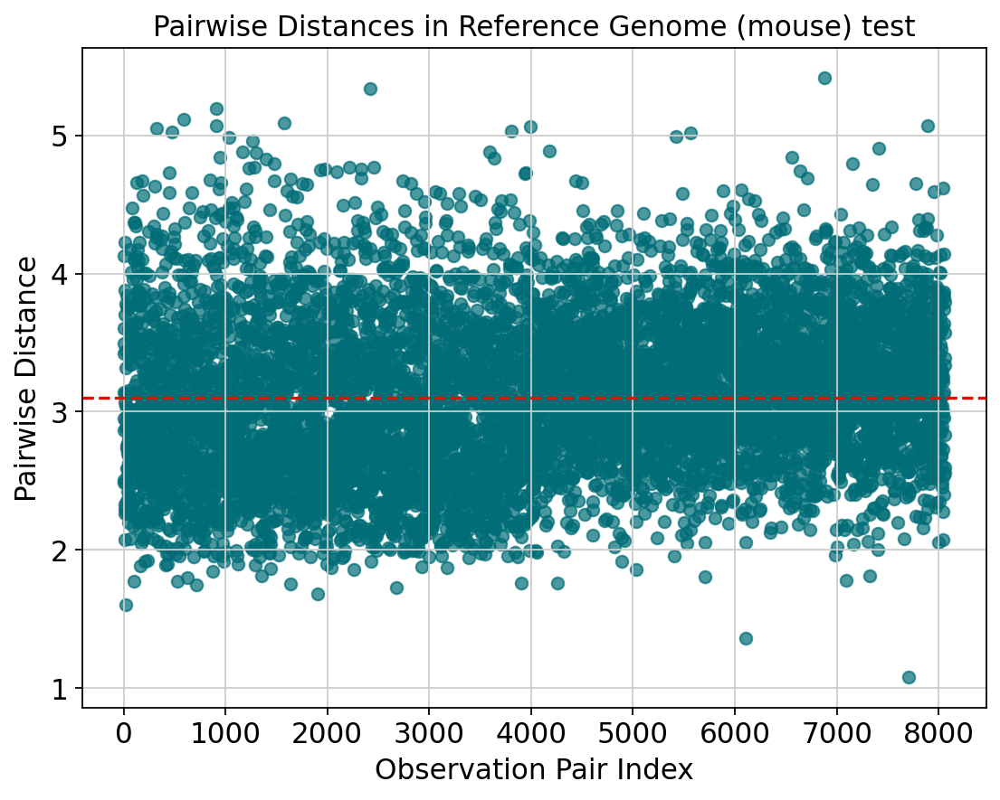

In [17]:
plt.figure(figsize=(8, 6))
plt.scatter(range(len(distances)), distances, color='#006d77', alpha=0.7)
plt.axhline(median_distance, color='red', linestyle='--', label='Median')
plt.xlabel('Observation Pair Index')
plt.ylabel('Pairwise Distance')
plt.title('Pairwise Distances in Reference Genome (mouse) test')
plt.savefig('/home/hers_basak/jjiang/jack/outputs/deliverables/6_analysis/reference_distance.png')
plt.show()

# Concatenating 

## Hey only

In [10]:
adata_merge_hey = ad.concat([adata_hey_93_f1_processed,
adata_hey_98_f1_processed ],  join="outer", fill_value=0)
adata_merge_hey.obs_names_make_unique()

sc.tl.pca(adata_merge_hey, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(adata_merge_hey, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(adata_merge_hey)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


<AxesSubplot:title={'center':'Reference genome'}, xlabel='UMAP1', ylabel='UMAP2'>

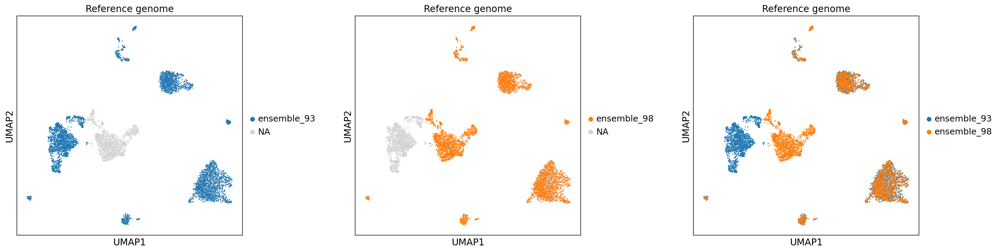

In [11]:
fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(adata_merge_hey, color='reference', groups= 'ensemble_93', use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(adata_merge_hey, color='reference', groups= 'ensemble_98', use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(adata_merge_hey, color='reference', use_raw=False, s=10, ax= axs[2],show=False, title='Reference genome')


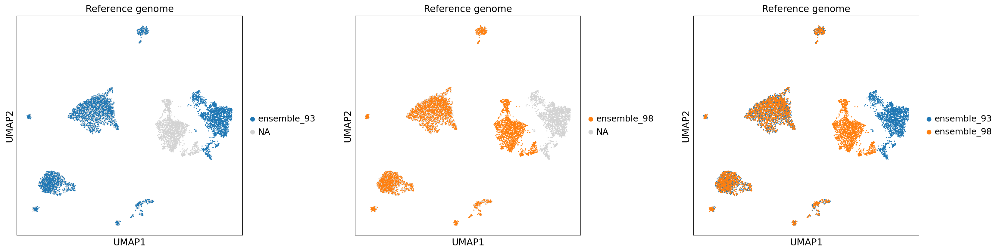

In [31]:
fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(adata_merge_hey, color='reference', groups= 'ensemble_93', use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(adata_merge_hey, color='reference', groups= 'ensemble_98', use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(adata_merge_hey, color='reference', use_raw=False, s=10, ax= axs[2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_hey_noreg_subplots.png',bbox_inches='tight')

In [25]:
adata_merge_hey = ad.concat([adata_hey_93_f1_reg_processed,
adata_hey_98_f1_reg_processed ],  join="outer", fill_value=0)
adata_merge_hey.obs_names_make_unique()

sc.tl.pca(adata_merge_hey, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(adata_merge_hey, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(adata_merge_hey)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


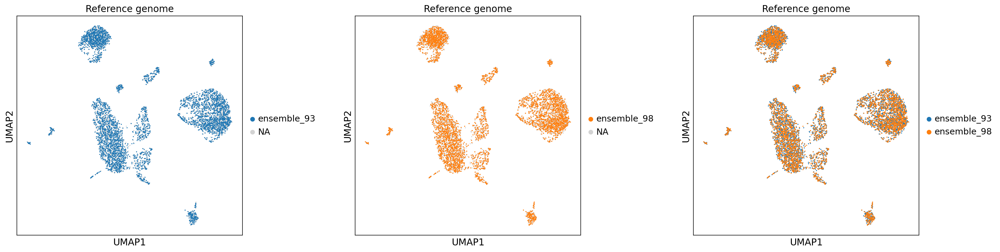

In [29]:
fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(adata_merge_hey, color='reference', groups= 'ensemble_93', use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(adata_merge_hey, color='reference', groups= 'ensemble_98', use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(adata_merge_hey, color='reference', use_raw=False, s=10, ax= axs[2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_hey_subplots.png',bbox_inches='tight')

## Zhong

In [32]:
adata_merge_zhong = ad.concat([adata_zhong_93_f1_processed,
adata_zhong_98_f1_processed ],  join="outer", fill_value=0)
adata_merge_hey.obs_names_make_unique()

sc.tl.pca(adata_merge_zhong, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(adata_merge_zhong, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(adata_merge_zhong)



/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


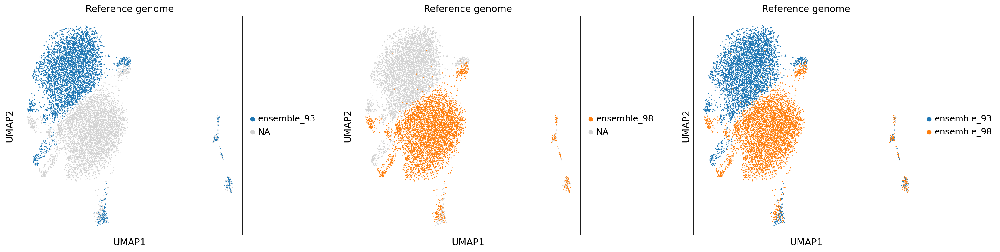

In [33]:
fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(adata_merge_zhong, color='reference', groups= 'ensemble_93', use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(adata_merge_zhong, color='reference', groups= 'ensemble_98', use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(adata_merge_zhong, color='reference', use_raw=False, s=10, ax= axs[2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_zhong_subplots.png',bbox_inches='tight')

In [27]:
adata_merge_zhong = ad.concat([adata_zhong_93_f1_reg_processed,
adata_zhong_98_f1_reg_processed ],  join="outer", fill_value=0)
adata_merge_hey.obs_names_make_unique()

sc.tl.pca(adata_merge_zhong, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(adata_merge_zhong, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(adata_merge_zhong)



/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


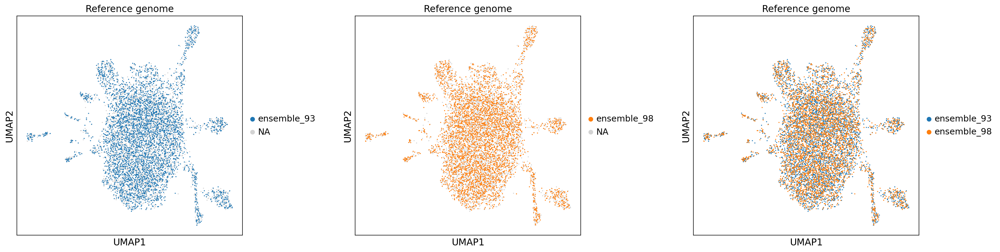

In [30]:
fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(adata_merge_zhong, color='reference', groups= 'ensemble_93', use_raw=False, s=10, ax= axs[0],show=False, title='Reference genome')
sc.pl.umap(adata_merge_zhong, color='reference', groups= 'ensemble_98', use_raw=False, s=10, ax= axs[1],show=False, title='Reference genome')
sc.pl.umap(adata_merge_zhong, color='reference', use_raw=False, s=10, ax= axs[2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_zhong_subplots.png',bbox_inches='tight')

## All data

In [8]:
#adata_merge = ad.concat([adata_hey_93_f1_reg_processed, adata_hey_98_f1_reg_processed ,adata_zhong_93_f1_reg_processed, adata_zhong_98_f1_reg_processed],  join="outer", fill_value=0)
adata_merge = ad.concat([adata_hey_93_f1_processed, adata_hey_98_f1_processed ,adata_zhong_93_f1_processed, adata_zhong_98_f1_processed],  join="outer", fill_value=0)

adata_merge.obs_names_make_unique()

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


pca again

In [9]:
sc.tl.pca(adata_merge, svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

In [36]:
nn= 15 #default 15
sc.pp.neighbors(adata_merge, n_neighbors=nn, n_pcs=40)
sc.tl.umap(adata_merge)

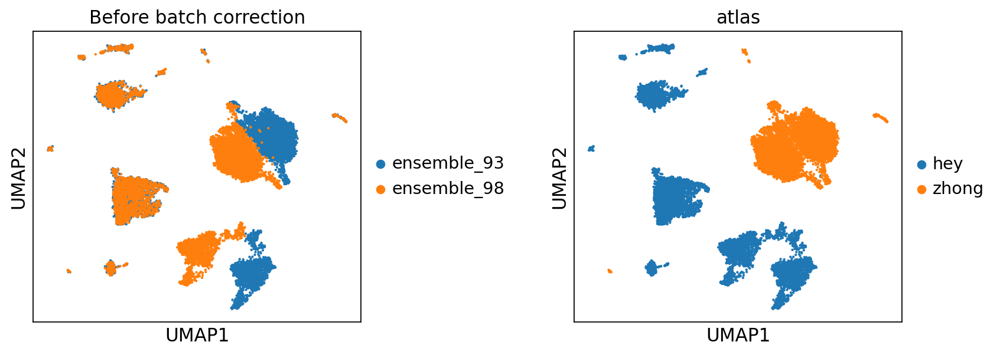

In [37]:
sc.pl.umap(adata_merge,color=['reference', 'atlas'], wspace=0.5,s=15, title='Before batch correction')

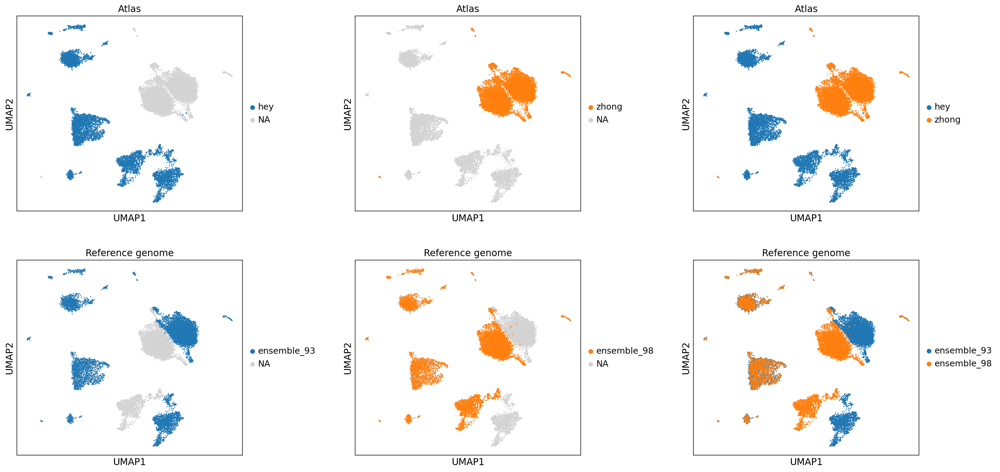

In [38]:
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge, color='atlas', groups= 'hey', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='atlas', groups= 'zhong', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='atlas', use_raw=False, s=10, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='reference', groups= 'ensemble_93', use_raw=False, s=10, ax= axs[1,0],show=False, title='Reference genome')
sc.pl.umap(adata_merge, color='reference', groups= 'ensemble_98', use_raw=False, s=10, ax= axs[1,1],show=False, title='Reference genome')
sc.pl.umap(adata_merge, color='reference', use_raw=False, s=10, ax= axs[1,2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_all_subplots.png',bbox_inches='tight')

In [39]:
adata_merge

AnnData object with n_obs × n_vars = 16516 × 19802
    obs: 'species', 'cngb_sample_id', 'sample_group', 'atlas', 'reference', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    uns: 'pca', 'neighbors', 'umap', 'reference_colors', 'atlas_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

KeyError: 'Could not find key Rbfox3 in .var_names or .obs.columns.'

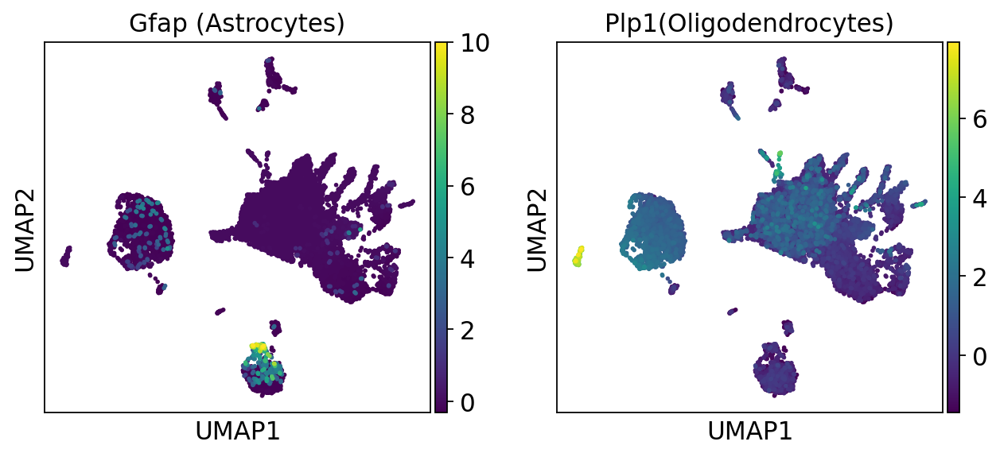

In [37]:

    if adata_merge.obs['species'][0] == 'Homo sapien':
        sc.pl.umap(adata_merge, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=25)
           #,save = "merge_umap_n"+str(nn)+"_2.pdf")
    else:
        sc.pl.umap(adata_merge, color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [40]:
adata_merge_rb = adata_merge.copy()

In [41]:
sc.external.pp.harmony_integrate(adata_merge_rb, key =['atlas'])

2023-06-30 19:30:55,206 - harmonypy - INFO - Iteration 1 of 10
2023-06-30 19:30:59,091 - harmonypy - INFO - Iteration 2 of 10
2023-06-30 19:31:03,064 - harmonypy - INFO - Converged after 2 iterations


In [42]:
sc.tl.pca(adata_merge_rb, svd_solver='arpack')

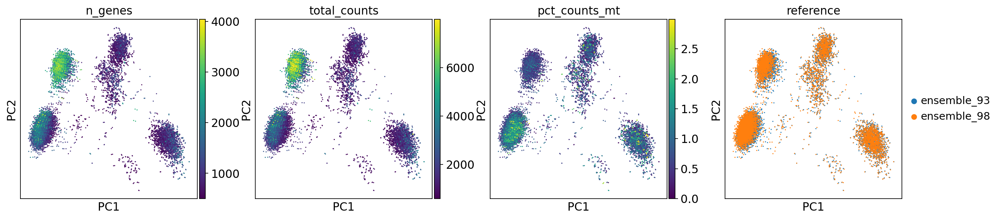

In [43]:
sc.pl.pca(adata_merge, color=['n_genes', 'total_counts', 'pct_counts_mt', 'reference'], save = "_merge_pca_1.pdf")
#    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


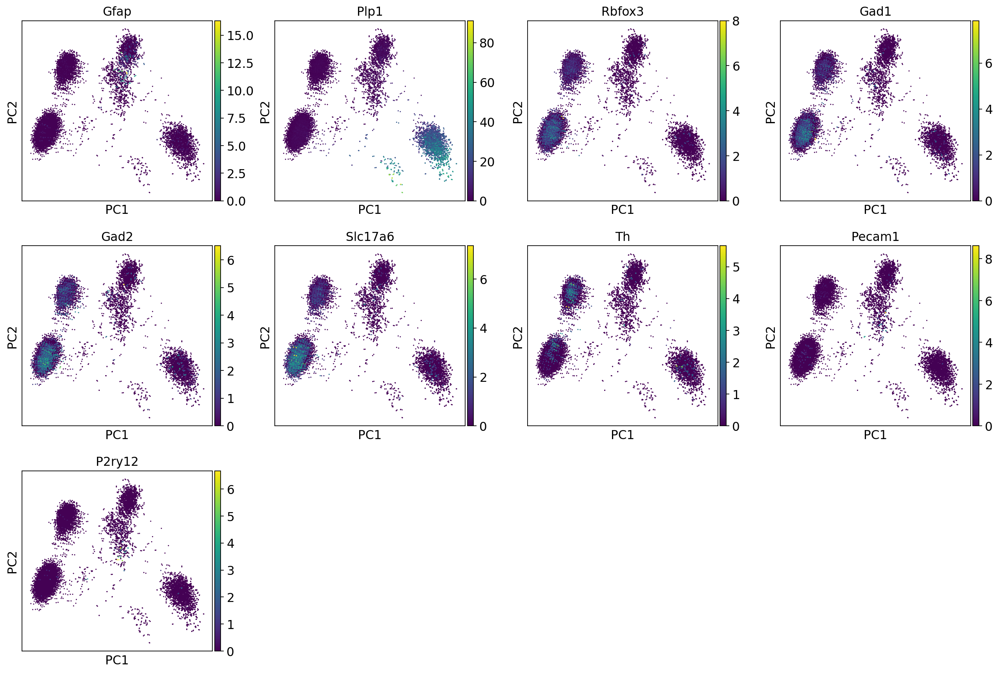

In [44]:
sc.pl.pca(adata_merge_rb, color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2','Slc17a6','Th','Pecam1','P2ry12' ])

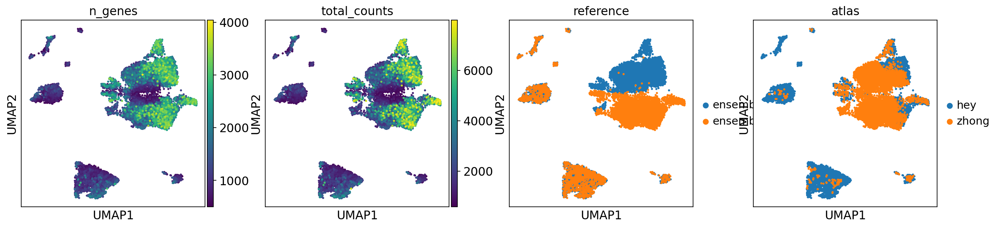

In [45]:
sc.pp.neighbors(adata_merge_rb, n_neighbors=nn, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata_merge_rb)
sc.pl.umap(adata_merge_rb, color=['n_genes', 'total_counts','reference', 'atlas'], 
           use_raw=False, s=25,save = '_merge_batch_rb_1.pdf')

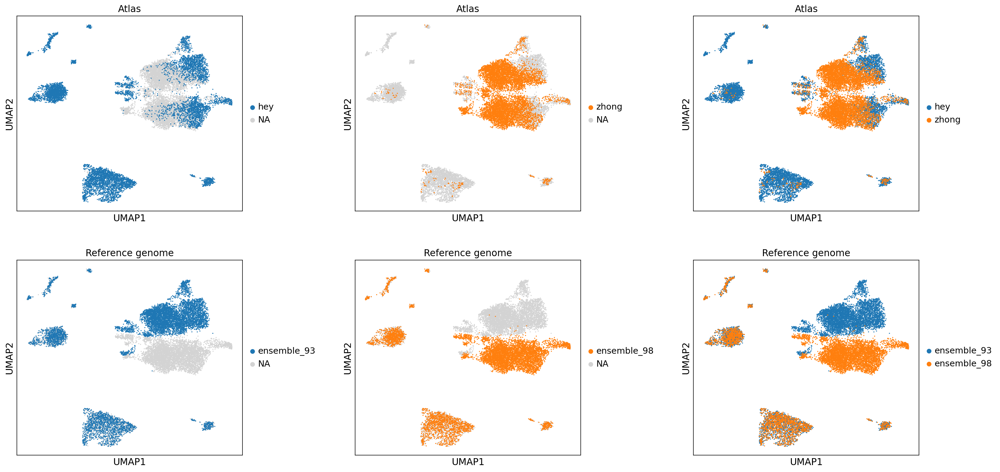

In [46]:

fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'hey', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'zhong', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', use_raw=False, s=10, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='reference', groups= 'ensemble_93', use_raw=False, s=10, ax= axs[1,0],show=False, title='Reference genome')
sc.pl.umap(adata_merge_rb, color='reference', groups= 'ensemble_98', use_raw=False, s=10, ax= axs[1,1],show=False, title='Reference genome')
sc.pl.umap(adata_merge_rb, color='reference', use_raw=False, s=10, ax= axs[1,2],show=False, title='Reference genome')
fig.savefig('figures/merge/merge_batch_rb_subplots.png',bbox_inches='tight')

In [47]:
atlas_ref = adata_merge_rb.obs['atlas'].astype(str)+ "_" + adata_merge_rb.obs['reference'].astype(str)
adata_merge_rb.obs['atlas_ref'] = atlas_ref

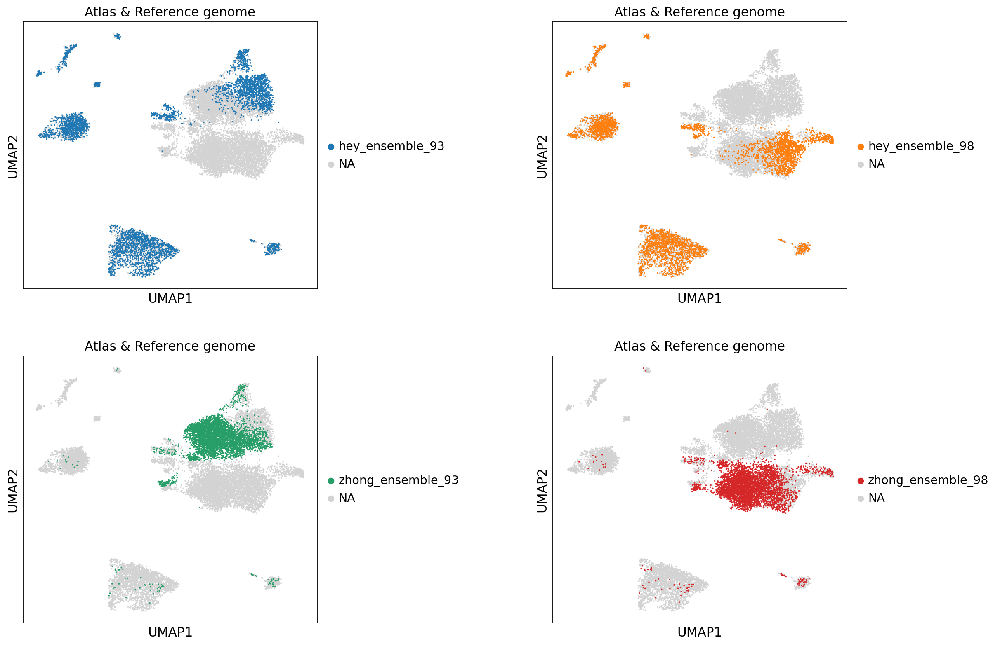

In [48]:
fig, axs = plt.subplots(2, 2, figsize = [16,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.8, hspace=0.25)
sc.pl.umap(adata_merge_rb, color='atlas_ref', groups= 'hey_ensemble_93', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas & Reference genome')
sc.pl.umap(adata_merge_rb, color='atlas_ref', groups= 'hey_ensemble_98', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas & Reference genome')
sc.pl.umap(adata_merge_rb, color='atlas_ref', groups= 'zhong_ensemble_93', use_raw=False, s=10, ax= axs[1,0],show=False, title='Atlas & Reference genome')
sc.pl.umap(adata_merge_rb, color='atlas_ref', groups= 'zhong_ensemble_98', use_raw=False, s=10, ax= axs[1,1],show=False, title='Atlas & Reference genome')
#sc.pl.umap(adata_merge_rb, color='atlas_ref', use_raw=False, s=25, ax= axs[0,2],show=False)
fig.savefig('figures/merge/merge_batch_rb_specific_subplots.png',bbox_inches='tight')

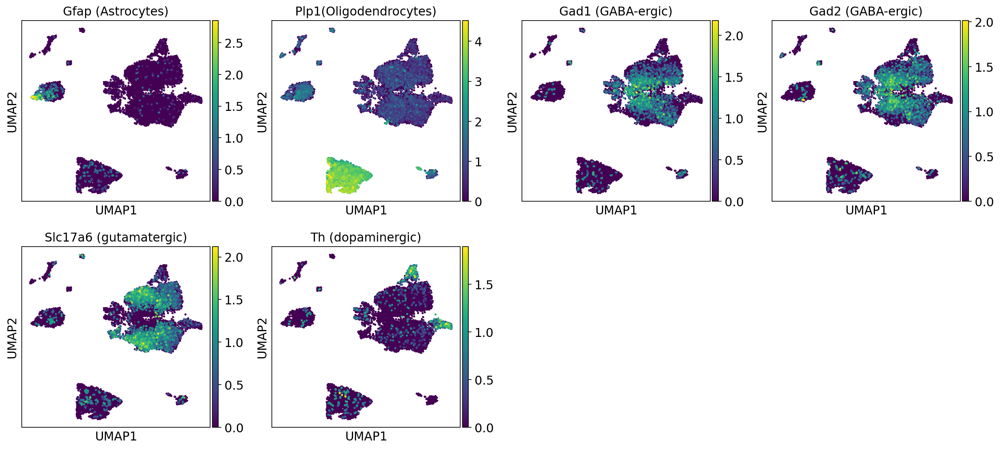

In [49]:
sc.pl.umap(adata_merge_rb, color=['Gfap', 'Plp1','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25)
   #save = "_merge_umap_n"+str(nn)+"_2.pdf")

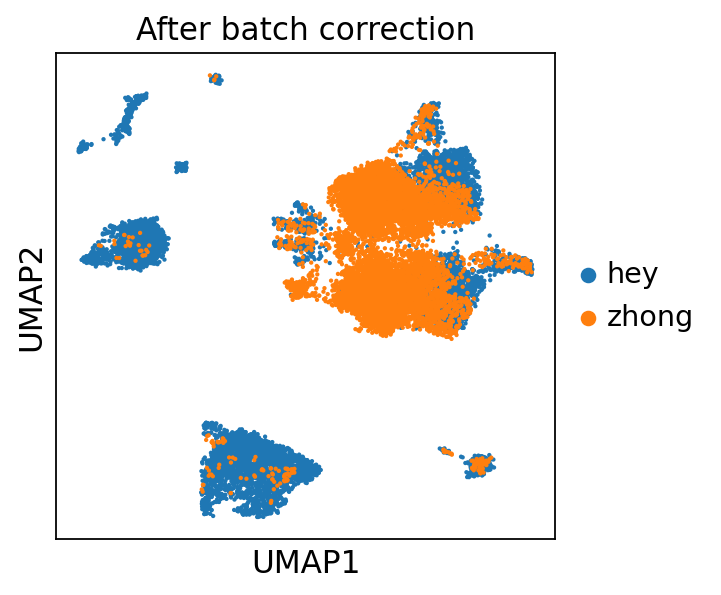

In [50]:
sc.pl.umap(adata_merge_rb, color=['atlas'], use_raw=False, s=15,title='After batch correction')